In [1]:
import numpy as np
import matplotlib.pyplot as plt

from PyMPDATA import (
    ScalarField,
    Solver,
    Stepper,
    VectorField,
    Options,
    boundary_conditions,
)

from open_atmos_jupyter_utils import show_anim



In [2]:
from dataclasses import dataclass

@dataclass
class IslandConfig:
    distance_from_beach: float
    island_radius: float
    shoal_width: float
    shoal_depth_factor: float   

In [3]:
class ShallowWaterEquationsIntegrator:
    def __init__(
        self,
        *,
        h_initial: np.ndarray,
        bathymetry: np.ndarray,
        options: Options = None
    ):

        options = options or Options(nonoscillatory=True, infinite_gauge=True)
        X, Y = 0, 1
        grid = h_initial.shape

        self.bathymetry = bathymetry

        stepper = Stepper(options=options, grid=grid, n_threads=1)
        kwargs = {
            "boundary_conditions": [boundary_conditions.Constant(value=0)] * len(grid),
            "halo": options.n_halo,
        }

        advectees = {
            "h":  ScalarField(h_initial,      **kwargs),
            "uh": ScalarField(np.zeros(grid), **kwargs),
            "vh": ScalarField(np.zeros(grid), **kwargs),
        }

        self.advector = VectorField(
            (
                np.zeros((grid[X] + 1, grid[Y]    )),
                np.zeros((grid[X],     grid[Y] + 1))
            ),
            **kwargs
        )

        self.solvers = {
            k: Solver(stepper, v, self.advector) for k, v in advectees.items()
        }

    def __getitem__(self, key):

        return self.solvers[key].advectee.get()

    def _apply_half_rhs(self, *, key, axis, g_times_dt_over_dxy):

        self[key][:] -= 0.5 * g_times_dt_over_dxy * self["h"] * np.gradient(
            self["h"] - self.bathymetry, axis=axis
        )

    def _update_courant_numbers(self, *, axis, key, mask, dt_over_dxy):
        velocity = np.where(mask, np.nan, 0.0)
        momentum = self[key]
        np.divide(momentum, self["h"], where=mask, out=velocity)

        all_ = slice(None, None)
        all_but_last = slice(None, -1)
        all_but_first_and_last = slice(1, -1)

        velocity_face = velocity[(
            (all_but_last, all_),
            (all_,        all_but_last),
        )[axis]] + np.diff(velocity, axis=axis) / 2.0

        courant = self.advector.get_component(axis)[(
            (all_but_first_and_last, all_),
            (all_,                  all_but_first_and_last),
        )[axis]]
        courant[:] = velocity_face * dt_over_dxy[axis]

        assert np.max(np.abs(courant)) <= 1

    def __call__(self, *, nt: int, g: float, dt_over_dxy: tuple,
                 outfreq: int, eps: float = 1e-7):

        output = {k: [] for k in self.solvers.keys()}

        for it in range(nt + 1):
            if it != 0:
                mask = self["h"] > eps

                for axis, key in enumerate(("uh", "vh")):
                    self._update_courant_numbers(
                        axis=axis, key=key, mask=mask, dt_over_dxy=dt_over_dxy
                    )

                self.solvers["h"].advance(n_steps=1)

                for axis, key in enumerate(("uh", "vh")):
                    self._apply_half_rhs(
                        key=key, axis=axis,
                        g_times_dt_over_dxy=g * dt_over_dxy[axis]
                    )
                    self.solvers[key].advance(n_steps=1)
                    self._apply_half_rhs(
                        key=key, axis=axis,
                        g_times_dt_over_dxy=g * dt_over_dxy[axis]
                    )

                dry = ~mask
                self["uh"][dry] = 0.0
                self["vh"][dry] = 0.0

            if it % outfreq == 0:
                for key in self.solvers.keys():
                    output[key].append(self[key].copy())

        return output



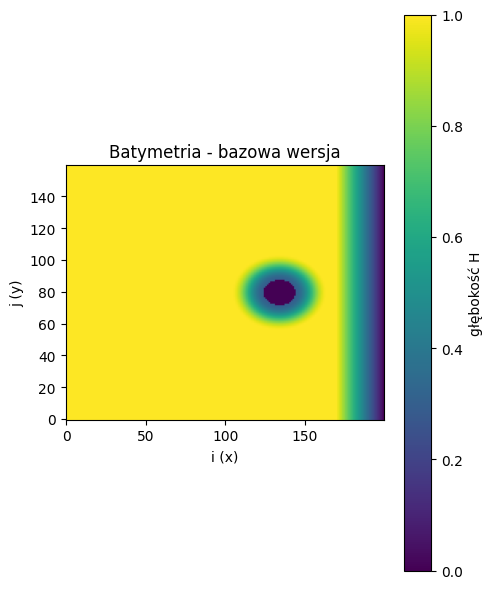

In [4]:

def build_coordinates(grid):
    nx, ny = grid
    x = np.linspace(0.0, 1.0, nx)[:, None]
    y = np.linspace(0.0, 1.0, ny)[None, :]
    X = np.broadcast_to(x, grid)
    Y = np.broadcast_to(y, grid)
    return X, Y


def build_bathymetry_island_param(grid,
                                  cfg: IslandConfig,
                                  H_deep: float = 1.0,
                                  H_min_floor: float = 0.0,
                                  x_beach_start: float = 0.85):

    nx, ny = grid
    X, Y = build_coordinates(grid)

    H = H_deep * np.ones(grid)

    beach_mask = X > x_beach_start
    if np.any(beach_mask):
        t = (X[beach_mask] - x_beach_start) / (1.0 - x_beach_start)  # 0..1
        t = np.clip(t, 0.0, 1.0)
        H_beach = H_deep - (H_deep - H_min_floor) * t
        H[beach_mask] = H_beach

    xc_island = x_beach_start - cfg.distance_from_beach
    yc_island = 0.5

    r = np.sqrt((X - xc_island)**2 + (Y - yc_island)**2)

    R_core  = cfg.island_radius
    R_shoal = cfg.island_radius + cfg.shoal_width

    core_mask = r < R_core
    H[core_mask] = 0.0

    shoal_mask = (r >= R_core) & (r < R_shoal)
    if np.any(shoal_mask):
        s = (r[shoal_mask] - R_core) / (R_shoal - R_core)   # 0..1
        phi = s**2 * (3.0 - 2.0*s)
        H_shoal_min = cfg.shoal_depth_factor * H_deep
        H_shoal = H_shoal_min + (H_deep - H_shoal_min) * phi

        H[shoal_mask] = np.minimum(H[shoal_mask], H_shoal)

    H = np.clip(H, H_min_floor, H_deep)

    return H

cfg_ref = IslandConfig(
    distance_from_beach=0.18,
    island_radius=0.05,
    shoal_width=0.10,
    shoal_depth_factor=0.3 
)

grid_example = (200, 160)
H_example = build_bathymetry_island_param(grid_example, cfg_ref)

plt.figure(figsize=(5, 6))
plt.imshow(H_example.T, origin="lower", cmap="viridis")
plt.colorbar(label="głębokość H")
plt.gca().set_aspect("equal", "box")
plt.title("Batymetria - bazowa wersja")
plt.xlabel("i (x)")
plt.ylabel("j (y)")
plt.tight_layout()
plt.show()

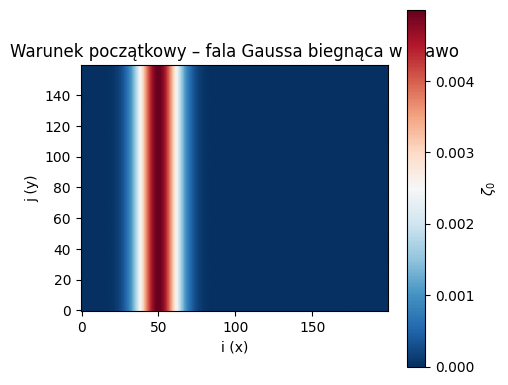

In [5]:
def build_initial_travelling_wave(bathymetry, grid, g=10.0):

    X, Y = build_coordinates(grid)
    H0 = bathymetry

    x0    = 0.25
    sigma = 0.05
    amp   = 0.005

    eta = amp * np.exp(-((X - x0) ** 2) / (2.0 * sigma ** 2))

    h0 = H0 + eta

    H_ref = 1.0
    c = np.sqrt(g * H_ref)
    u = c * eta / H_ref
    uh0 = u * h0


    vh0 = np.zeros_like(h0)

    return h0, uh0, vh0


h0_base, uh0_base, vh0_base = build_initial_travelling_wave(
    H_example, grid_example, g=10.0
)

zeta0_base = h0_base - H_example

plt.figure(figsize=(5, 4))
plt.imshow(zeta0_base.T, origin="lower", cmap="RdBu_r")
plt.colorbar(label=r"$\zeta_0$")
plt.title("Warunek początkowy – fala Gaussa biegnąca w prawo")
plt.xlabel("i (x)")
plt.ylabel("j (y)")
plt.tight_layout()
plt.show()


In [6]:
def run_shallow_water_sim_island(params, cfg: IslandConfig,
                                 case_label="", x_beach_start: float = 0.85):
    grid        = params["grid"]
    dt_over_dxy = params["dt_over_dxy"]
    nt          = params["nt"]
    outfreq     = params["outfreq"]
    eps         = params["eps"]
    g           = params.get("g", 10.0)

    bathymetry = build_bathymetry_island_param(
        grid, cfg, H_deep=1.0, H_min_floor=0.0, x_beach_start=x_beach_start
    )

    h0, uh0, vh0 = build_initial_travelling_wave(bathymetry, grid, g=g)

    integrator = ShallowWaterEquationsIntegrator(
        h_initial=h0,
        bathymetry=bathymetry,
    )

    integrator["uh"][:] = uh0
    integrator["vh"][:] = vh0

    output = integrator(
        nt=nt,
        g=g,
        dt_over_dxy=dt_over_dxy,
        outfreq=outfreq,
        eps=eps,
    )

    sim = {
        "grid":        grid,
        "dt_over_dxy": dt_over_dxy,
        "nt":          nt,
        "outfreq":     outfreq,
        "eps":         eps,
        "g":           g,
        "bathymetry":  bathymetry,
        "output":      output,
        "label":       case_label,
        "cfg":         cfg,
        "x_beach_start": x_beach_start 
    }

    zeta = np.array(output["h"]) - bathymetry[None, :, :]

    return sim, zeta


In [7]:


def max_amp_and_beach_profile(sim, zeta_frames):
    zeta_max = np.max(zeta_frames, axis=0)
    grid = sim["grid"]
    nx, ny = grid
    i_beach = int(0.9 * nx)
    y_coords = np.linspace(0.0, 1.0, ny)
    zeta_max_beach = zeta_max[i_beach, :]
    return zeta_max, y_coords, zeta_max_beach

def plot_max_amp_and_beach(sim, zeta_frames, case_label):
    zeta_max, y_coords, zeta_max_beach = max_amp_and_beach_profile(sim, zeta_frames)

    plt.figure(figsize=(5, 4))
    plt.imshow(zeta_max.T, origin="lower", cmap="Reds")
    plt.colorbar(label=r"Max $\zeta$")
    plt.title(f"Maksymalna dodatnia amplituda – {case_label}")
    plt.xlabel("i (x)")
    plt.ylabel("j (y)")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(6, 4))
    plt.plot(y_coords, zeta_max_beach)
    plt.xlabel("Położenie wzdłuż plaży (y)")
    plt.ylabel(r"Max $\zeta$ na plaży")
    plt.grid(True)
    plt.title(f"Profil max $\zeta$ na plaży – {case_label}")
    plt.tight_layout()
    plt.show()

    return y_coords, zeta_max_beach

In [8]:
def compute_zeta_frames(sim):

    output = sim["output"]
    bathy  = sim["bathymetry"]
    eps    = sim["eps"]

    h_all = np.array(output["h"])
    zeta_frames = h_all - bathy[None, :, :]

    dry_mask = h_all <= eps

    zeta_frames[dry_mask] = 0.0

    return zeta_frames




def build_gauges(sim):
    grid = sim["grid"]
    nx, ny = grid

    X, Y = build_coordinates(grid)
    x_beach_start = sim.get("x_beach_start", 0.85)

    x_beach_center = 0.5 * (x_beach_start + 1.0)

    def ij_from_xy(x, y):
        i = int(np.argmin(np.abs(X[:, 0] - x)))
        j = int(np.argmin(np.abs(Y[0, :] - y)))
        return i, j

    g_beach_center = ij_from_xy(x_beach_center, 0.50)
    g_beach_up     = ij_from_xy(x_beach_center, 0.70)
    g_beach_down   = ij_from_xy(x_beach_center, 0.30)

    if "cfg" in sim:
        cfg = sim["cfg"]
        xc_island = x_beach_start - cfg.distance_from_beach
        yc_island = 0.5
        R_shoal   = cfg.island_radius + cfg.shoal_width

        x_behind = min(
            xc_island + (R_shoal + 0.02),
            x_beach_start - 0.02
        )
        g_behind = ij_from_xy(x_behind, yc_island)
    else:
        g_behind = ij_from_xy(0.65, 0.50)

    return {
        "plaża - środek": g_beach_center,
        "plaża - góra":   g_beach_up,
        "plaża - dół":    g_beach_down,
        "za wyspą":       g_behind,
    }


def snapshots_2d(sim, zeta_frames, case_label, frames=(0, None, -1)):
    outfreq = sim["outfreq"]
    n_frames = zeta_frames.shape[0]

    fr_list = []
    for f in frames:
        if f is None:
            fr_list.append(n_frames // 2)
        elif f < 0:
            fr_list.append(n_frames + f)
        else:
            fr_list.append(f)

    A = np.max(np.abs(zeta_frames))
    if A == 0:
        A = 1e-6

    for fr in fr_list:
        plt.figure(figsize=(5, 4))
        z = zeta_frames[fr].T
        im = plt.imshow(
            z,
            origin="lower",
            cmap="RdBu_r",
            vmin=-A,
            vmax=A,
        )
        plt.colorbar(im, label=r"$\zeta$")
        plt.title(f"{case_label}: frame = {fr},  t ≈ {fr*outfreq}")
        plt.xlabel("i (x)")
        plt.ylabel("j (y)")
        plt.tight_layout()
        plt.show()

def gauges_timeseries(sim, zeta_series, label=""):
    out      = sim["output"]
    nt_out   = len(out["h"])
    outfreq  = sim["outfreq"]
    times    = np.arange(nt_out) * outfreq

    gauges_idx = build_gauges(sim)

    zeta_ts = {name: zeta_series[:, i, j]
               for name, (i, j) in gauges_idx.items()}

    plt.figure(figsize=(8, 4))
    for key, series in zeta_ts.items():
        plt.plot(times, series, label=key)
    plt.xlabel("krok czasowy")
    plt.ylabel(r"$\zeta$")
    plt.title(f"Boje na plaży / za wyspą – {label}")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return times, zeta_ts




def max_amplitude_fields(sim, zeta_frames, case_label):
    grid  = sim["grid"]
    bathy = sim["bathymetry"]
    nx, ny = grid

    zeta_max = np.max(np.abs(zeta_frames), axis=0)

    plt.figure(figsize=(6, 5))
    plt.imshow(zeta_max.T, origin="lower", cmap="viridis")
    plt.colorbar(label=r"max $|\zeta|$")
    plt.gca().set_aspect('equal', 'box')
    plt.title(f"Mapa max |ζ| – {case_label}")
    plt.xlabel("i (x)")
    plt.ylabel("j (y)")
    plt.tight_layout()
    plt.show()

    i_beach = int(0.90 * nx)
    zeta_max_beach = np.max(np.abs(zeta_frames[:, i_beach, :]), axis=0)

    y_coords = np.linspace(0.0, 1.0, ny)

    plt.figure(figsize=(7, 4))
    plt.plot(y_coords, zeta_max_beach, label=case_label)
    plt.xlabel("Położenie wzdłuż plaży (y)")
    plt.ylabel(r"Max $|\zeta|$ na plaży")
    plt.grid(True)
    plt.legend()
    plt.title(f"Profil max |ζ| na plaży – {case_label}")
    plt.tight_layout()
    plt.show()

    return y_coords, zeta_max_beach


def velocity_field_at_max_behind(sim, zeta_series, label=""):
    grid = sim["grid"]
    nx, ny = grid
    X, Y = build_coordinates(grid)
    H = sim["bathymetry"]
    g = sim.get("g", 10.0)

    h_series  = np.asarray(sim["output"]["h"])
    uh_series = np.asarray(sim["output"]["uh"])
    vh_series = np.asarray(sim["output"]["vh"])

    if "cfg" in sim:
        cfg = sim["cfg"]
        x_beach_start = sim.get("x_beach_start", 0.85)

        xc_island = x_beach_start - cfg.distance_from_beach
        R_shoal   = cfg.island_radius + cfg.shoal_width

        x_min = xc_island + (R_shoal + 0.01)
        x_max = x_beach_start - 0.02
        x_min = max(x_min, 0.0)
        x_max = min(x_max, 1.0)
    else:
        x_min, x_max = 0.6, 0.9

    region_mask = (X >= x_min) & (X <= x_max)

    zeta_abs_mean = np.mean(np.abs(zeta_series[:, region_mask]), axis=1)
    frame_idx = int(np.argmax(zeta_abs_mean))

    h  = h_series[frame_idx]
    uh = uh_series[frame_idx]
    vh = vh_series[frame_idx]
    zeta = zeta_series[frame_idx]

    eps_h = 1e-10
    h_safe = np.maximum(h, eps_h)
    u = uh / h_safe
    v = vh / h_safe
    step = 4

    fig, ax = plt.subplots(figsize=(6, 6))

    im = ax.imshow(
        zeta.T,
        origin="lower",
        cmap="RdBu_r",
        vmin=-np.max(np.abs(zeta)) * 0.8,
        vmax= np.max(np.abs(zeta)) * 0.8,
    )
    cbar = plt.colorbar(im, ax=ax, label=r"$\zeta$")

    Xq = X[::step, ::step]
    Yq = Y[::step, ::step]
    Uq = u[::step, ::step]
    Vq = v[::step, ::step]

    speed = np.sqrt(u**2 + v**2)
    vmax = np.max(speed)
    scale = 0.1 * vmax if vmax > 0 else 1.0

    ax.quiver(
        Xq, Yq,
        Uq, Vq,
        angles="xy",
        scale_units="xy",
        scale=10 * scale
    )

    ax.set_aspect("equal", "box")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_title(f"Pole prędkości + ζ\n{label}, klatka {frame_idx}")
    plt.tight_layout()
    plt.show()

    return frame_idx



In [9]:
base_params = {
    "grid":       (200, 160),
    "dt_over_dxy": (0.04, 0.04),
    "nt":         1500,
    "outfreq":    11,
    "eps":        0.01,
    "g":          10.0,
}

sim_base_ref, zeta_base_ref = run_shallow_water_sim_island(
    base_params, cfg_ref, case_label="Wyspa, siatka - wersja bazowa"
)




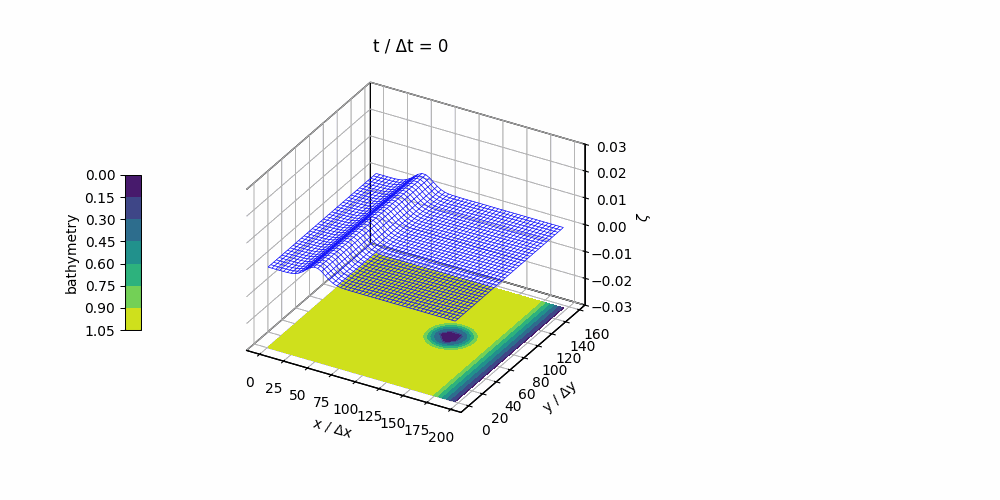

HTML(value="<a href='.\\tmp307phfmg.gif' target='_blank'>.\\tmp307phfmg.gif</a><br>")

In [10]:
def make_openatmos_plot(sim, *, zlim=None, step=4):
    output = sim["output"]
    bathy  = sim["bathymetry"]

    if zlim is None:
        zeta_frames = np.array([h - bathy for h in output["h"]])
        zmax = np.max(np.abs(zeta_frames))
        zlim = (-zmax, zmax if zmax > 0 else 1.0)

    def plot(frame, *, zlim=zlim):
        psi = output['h'][frame] - bathy

        xi_full, yi_full = np.indices(psi.shape)

        xi = xi_full[::step, ::step]
        yi = yi_full[::step, ::step]
        psi_s = psi[::step, ::step]
        bathy_s = bathy[::step, ::step]

        fig, ax = plt.subplots(
            subplot_kw={"projection": "3d"},
            figsize=(10, 5)
        )

        ax.plot_wireframe(
            xi + .5, yi + .5, psi_s,
            color='blue', linewidth=.5
        )

        ax.set(
            zlim=zlim,
            proj_type='ortho',
            title=f"t / Δt = {frame}",
            zlabel=r"$\zeta$"
        )

        for axis in (ax.xaxis, ax.yaxis, ax.zaxis):
            axis.pane.fill = False
            axis.pane.set_edgecolor('black')
            axis.pane.set_alpha(1)

        for axis in ('x', 'y'):
            getattr(ax, f'set_{axis}label')(f"{axis} / Δ{axis}")

        cb = plt.colorbar(
            ax.contourf(
                xi + .5, yi + .5, bathy_s,
                zdir='z', offset=zlim[0]
            ),
            pad=.1, aspect=10, fraction=.02,
            label='bathymetry', location='left'
        )
        cb.ax.invert_yaxis()

        return fig

    return plot

plot_base = make_openatmos_plot(sim_base_ref, zlim=(-0.03, 0.03), step=4)
show_anim(plot_base, range(0, len(sim_base_ref["output"]["h"]), 1))


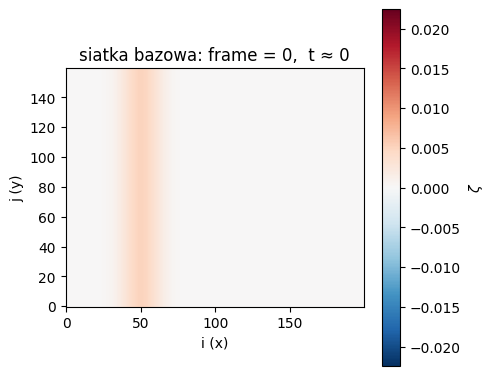

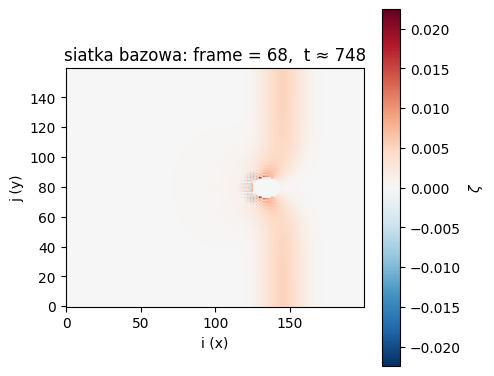

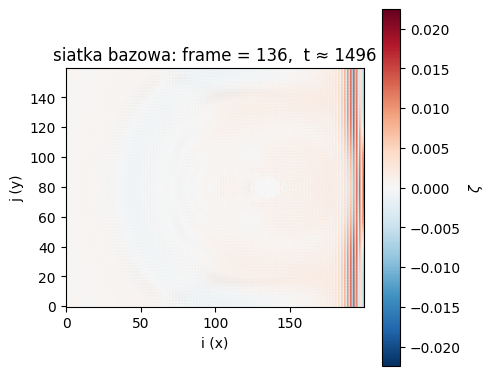

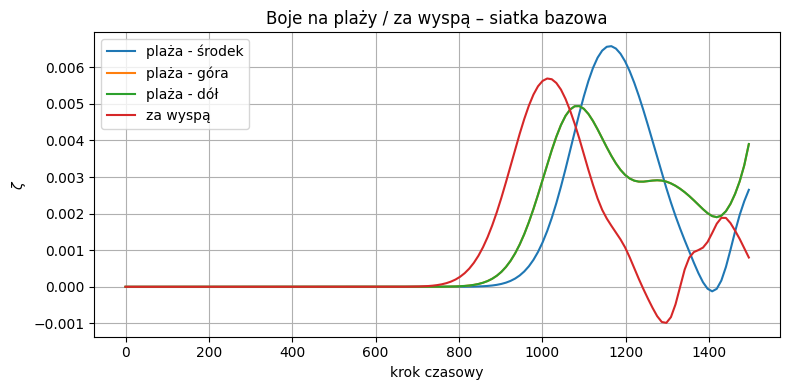

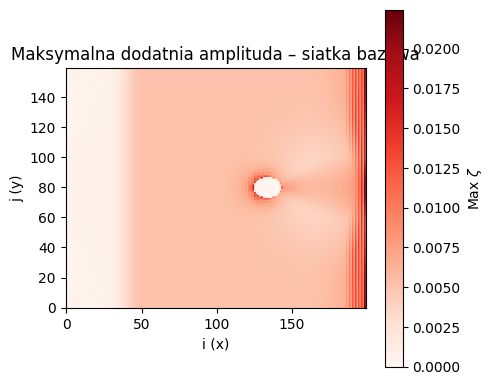

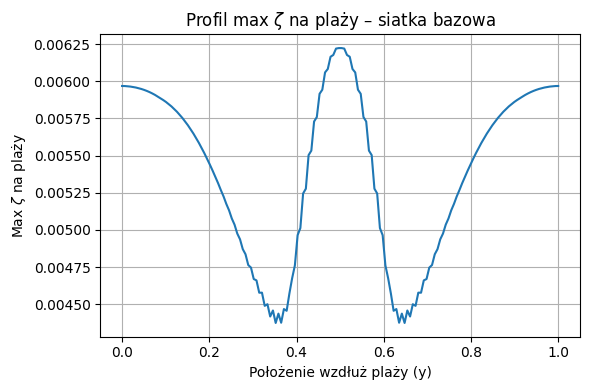

C:\Anaconda\envs\shallowwater_nb\Lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Anaconda\envs\shallowwater_nb\Lib\site-packages\numpy\_core\_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


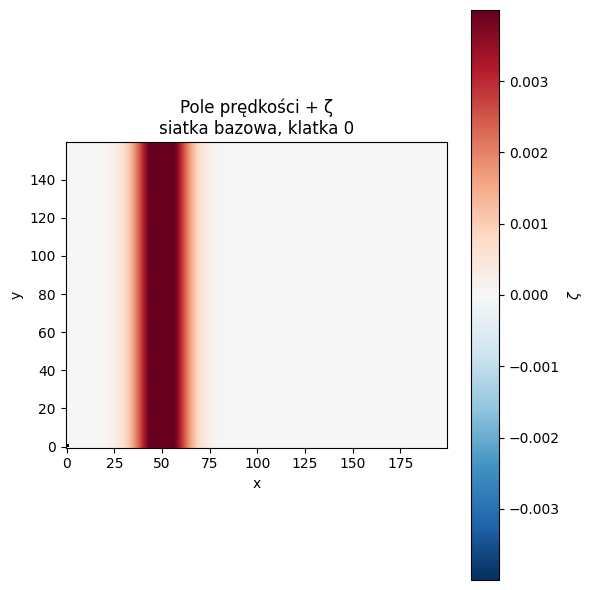

0

In [11]:
snapshots_2d(sim_base_ref, zeta_base_ref, "siatka bazowa", frames=(0, None, -1))
times_base, zeta_ts_base = gauges_timeseries(sim_base_ref, zeta_base_ref, "siatka bazowa")

y_base, zeta_max_beach_base = plot_max_amp_and_beach(sim_base_ref, zeta_base_ref, "siatka bazowa")

In [12]:
fine_params = {
    "grid":       (400, 320),
    "dt_over_dxy": (0.04, 0.04),
    "nt":         3000,
    "outfreq":    11,
    "eps":        0.01,
    "g":          10.0,
}
sim_fine_ref, zeta_fine_ref = run_shallow_water_sim_island(
    fine_params, cfg_ref, case_label="V1 ref, siatka 2x gęstsza")


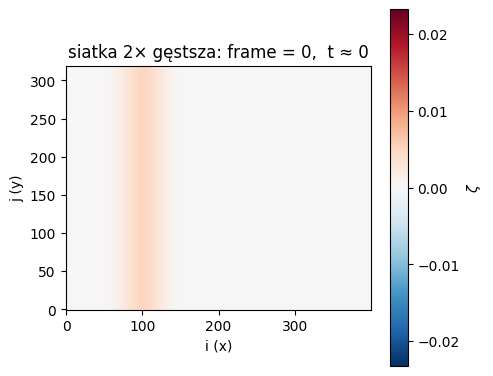

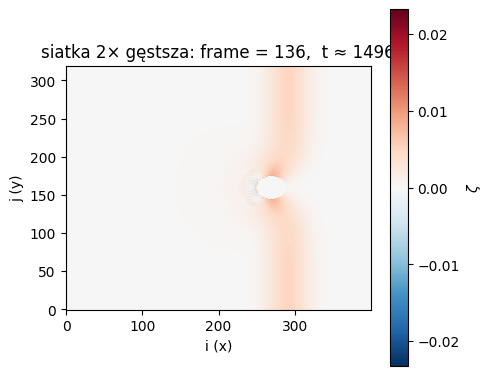

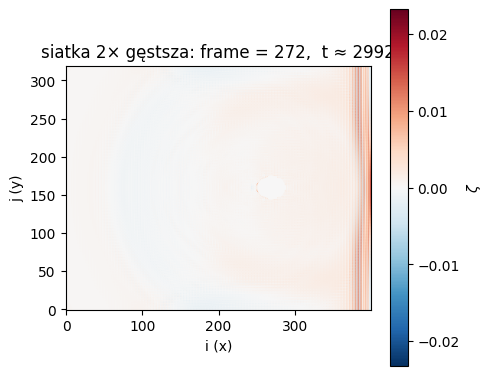

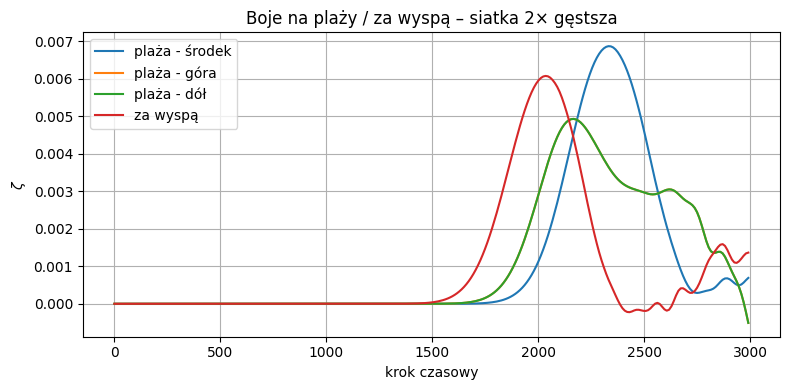

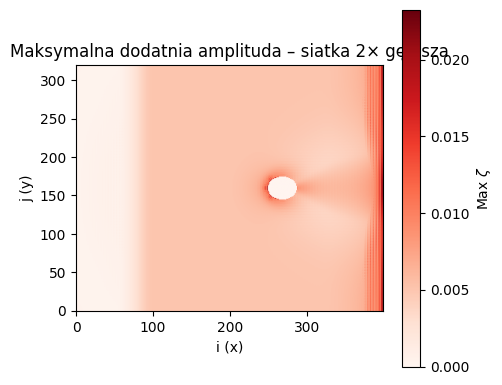

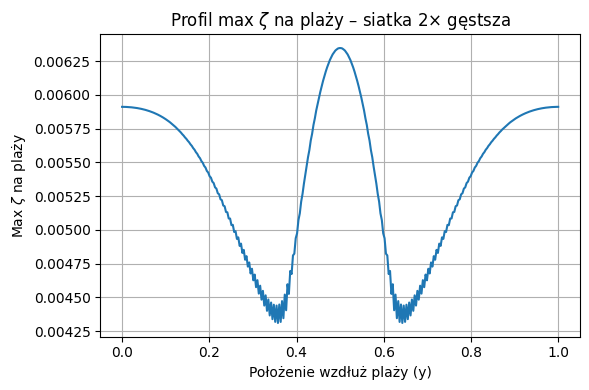

C:\Anaconda\envs\shallowwater_nb\Lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Anaconda\envs\shallowwater_nb\Lib\site-packages\numpy\_core\_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


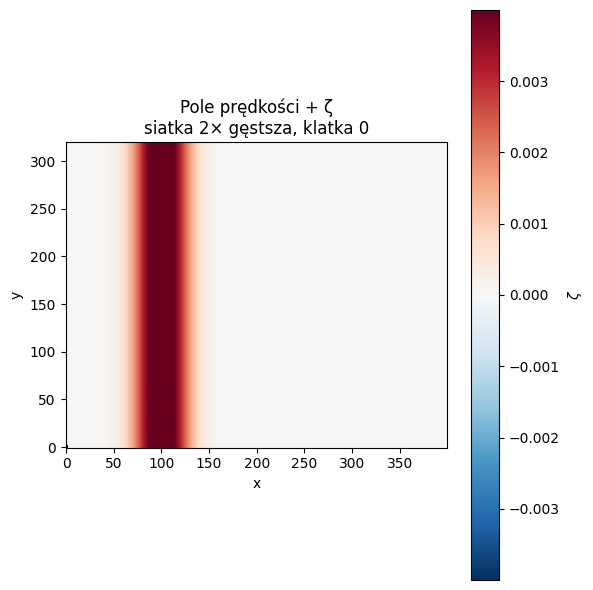

0

In [13]:
snapshots_2d(sim_fine_ref, zeta_fine_ref, "siatka 2× gęstsza", frames=(0, None, -1))
times_fine, zeta_ts_fine = gauges_timeseries(sim_fine_ref, zeta_fine_ref, "siatka 2× gęstsza")

y_fine, zeta_max_beach_fine = plot_max_amp_and_beach(sim_fine_ref, zeta_fine_ref, "siatka 2× gęstsza")

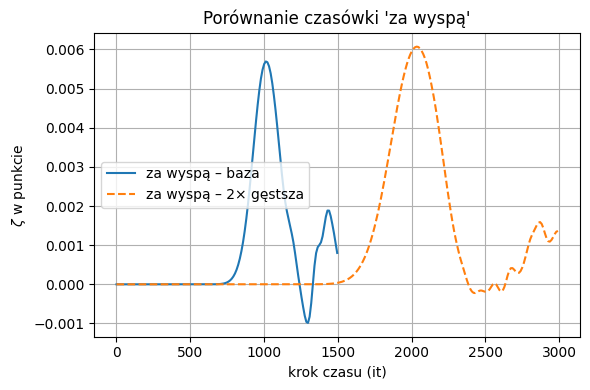

In [15]:
g_name = "za wyspą"

plt.figure(figsize=(6, 4))
plt.plot(times_base, zeta_ts_base[g_name], label=f"{g_name} – baza")
plt.plot(times_fine, zeta_ts_fine[g_name], "--", label=f"{g_name} – 2× gęstsza")
plt.xlabel("krok czasu (it)")
plt.ylabel(r"$\zeta$ w punkcie")
plt.grid(True)
plt.legend()
plt.title("Porównanie czasówki 'za wyspą'")
plt.tight_layout()
plt.show()



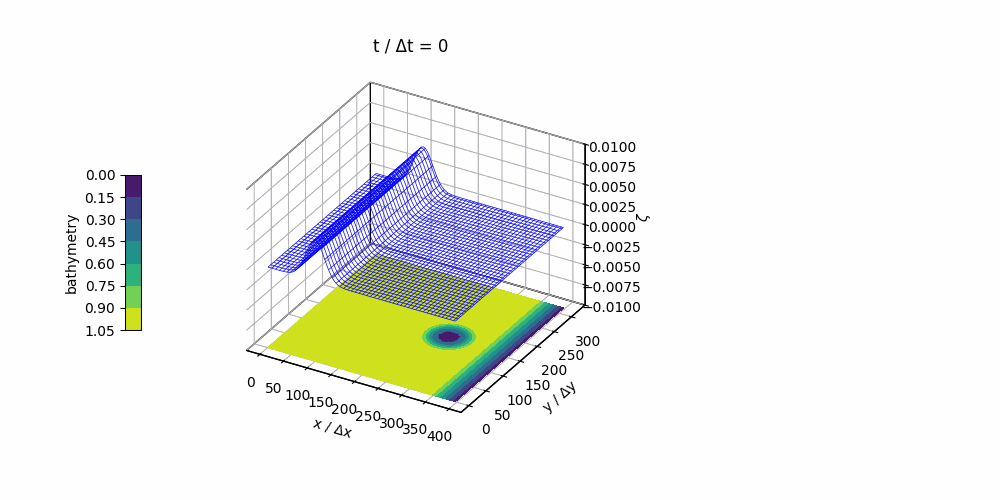

HTML(value="<a href='.\\tmpjtqki7v4.gif' target='_blank'>.\\tmpjtqki7v4.gif</a><br>")

In [16]:
plot_fine = make_openatmos_plot(sim_fine_ref, zlim=(-0.01, 0.01))
show_anim(plot_fine, range(len(sim_fine_ref["output"]["h"])))

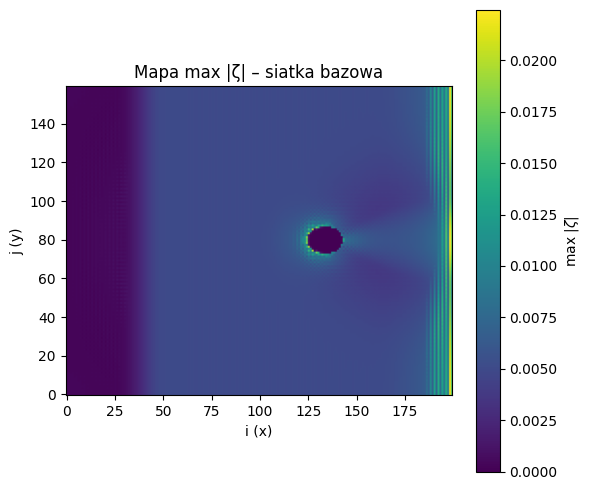

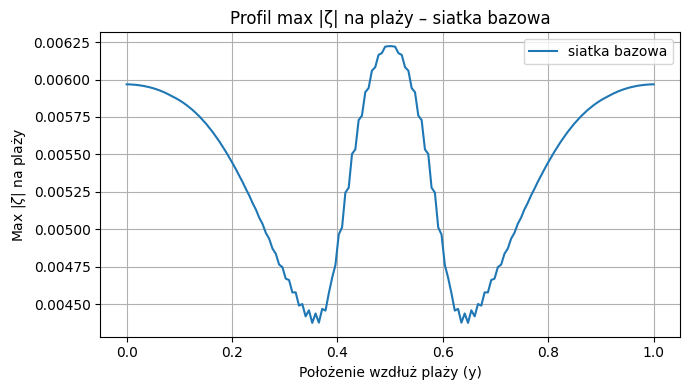

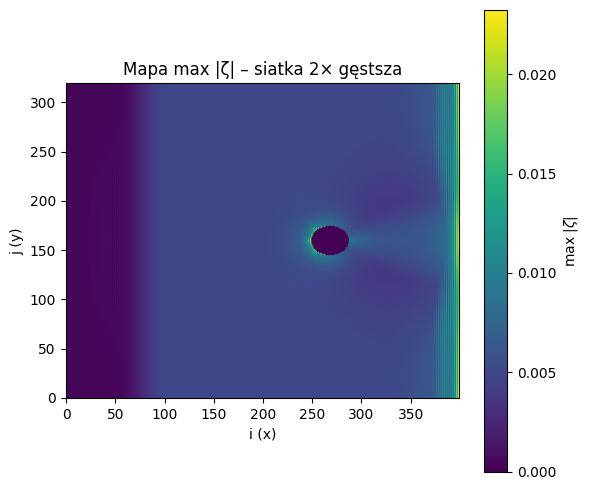

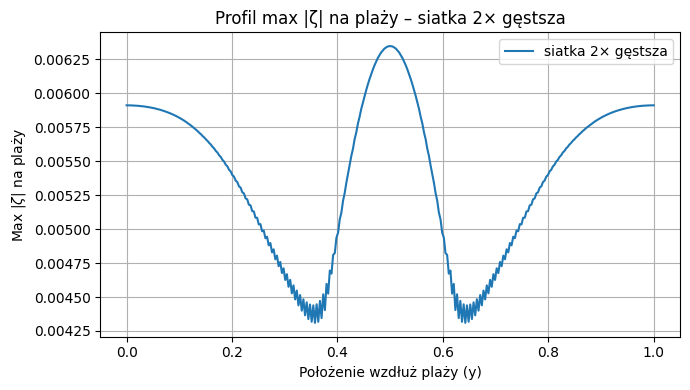

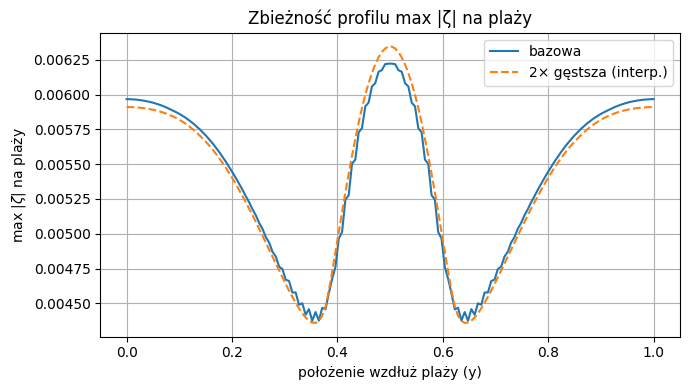

Maksymalna względna różnica profilu na plaży: 2.85%


In [17]:
y_base, zeta_max_beach_base = max_amplitude_fields(sim_base_ref, zeta_base_ref, "siatka bazowa")

y_fine, zeta_max_beach_fine = max_amplitude_fields(sim_fine_ref, zeta_fine_ref, "siatka 2× gęstsza")

zeta_fine_interp = np.interp(y_base, y_fine, zeta_max_beach_fine)

plt.figure(figsize=(7, 4))
plt.plot(y_base, zeta_max_beach_base, label="bazowa")
plt.plot(y_base, zeta_fine_interp, "--", label="2× gęstsza (interp.)")
plt.xlabel("położenie wzdłuż plaży (y)")
plt.ylabel(r"max $|\zeta|$ na plaży")
plt.grid(True)
plt.legend()
plt.title("Zbieżność profilu max |ζ| na plaży")
plt.tight_layout()
plt.show()

rel_err = np.max(
    np.abs(zeta_fine_interp - zeta_max_beach_base) /
    np.maximum(1e-6, np.abs(zeta_fine_interp))
)
print(f"Maksymalna względna różnica profilu na plaży: {rel_err:.2%}")


In [18]:
cfg_distance_far = IslandConfig(
    distance_from_beach=0.25,   # dalej od brzegu
    island_radius=0.05,
    shoal_width=0.10,
    shoal_depth_factor=0.3
)


cfg_shoal_deep = IslandConfig(
    distance_from_beach=0.18,
    island_radius=0.05,
    shoal_width=0.10,
    shoal_depth_factor=0.6   # głębsza mielizna
)

cfg_island_wide = IslandConfig(
    distance_from_beach=0.18,
    island_radius=0.07,       # szersza wyspa
    shoal_width=0.12,
    shoal_depth_factor=0.3
)
sim_base_far, zeta_base_far = run_shallow_water_sim_island(
    base_params, cfg_distance_far, case_label="V1: wyspa bliżej brzegu, baza"
)
sim_fine_far, zeta_fine_far = run_shallow_water_sim_island(
    fine_params, cfg_distance_far, case_label="V1: wyspa bliżej brzegu, 2x gęstsza"
)

sim_base_deep, zeta_base_deep = run_shallow_water_sim_island(
    base_params, cfg_shoal_deep, case_label="V1: wyspa bliżej brzegu, baza"
)
sim_fine_deep, zeta_fine_deep = run_shallow_water_sim_island(
    fine_params, cfg_shoal_deep, case_label="V1: wyspa bliżej brzegu, 2x gęstsza"
)


sim_base_wide, zeta_base_wide = run_shallow_water_sim_island(
    base_params, cfg_island_wide, case_label="V1: wyspa bliżej brzegu, baza"
)
sim_fine_wide, zeta_fine_wide = run_shallow_water_sim_island(
    fine_params, cfg_island_wide, case_label="V1: wyspa bliżej brzegu, 2x gęstsza"
)

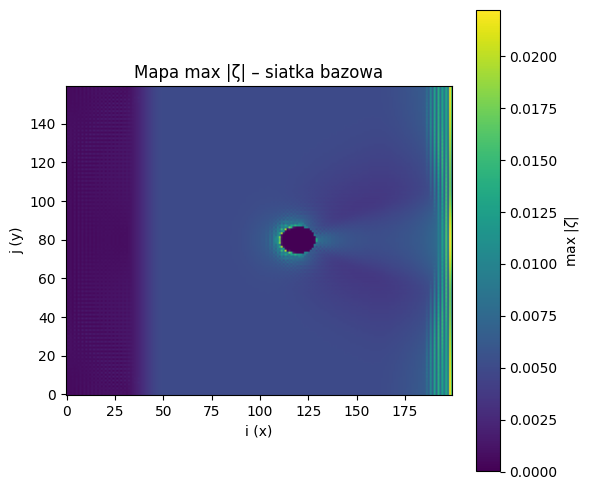

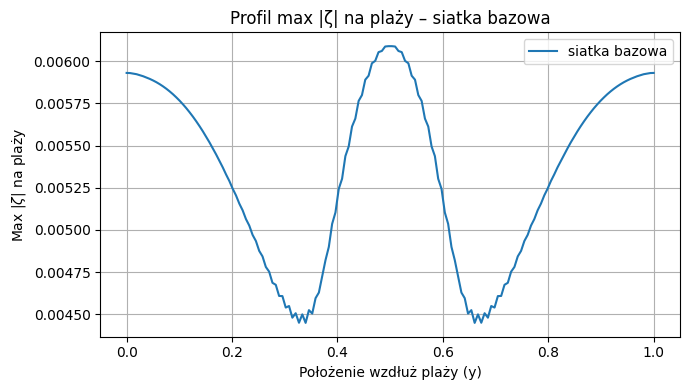

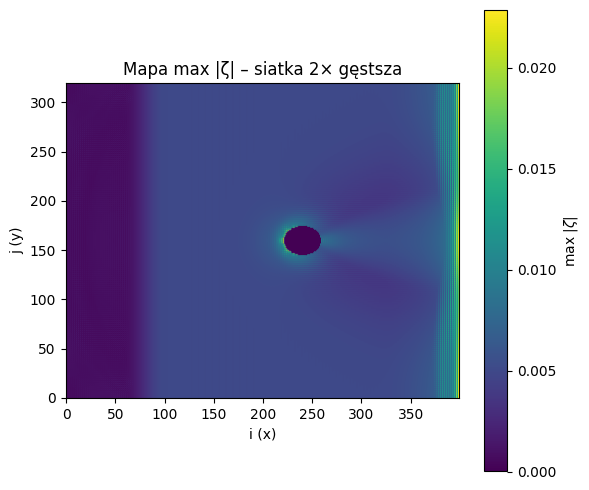

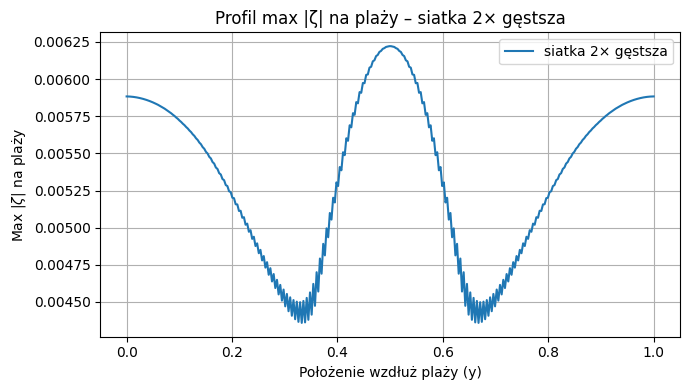

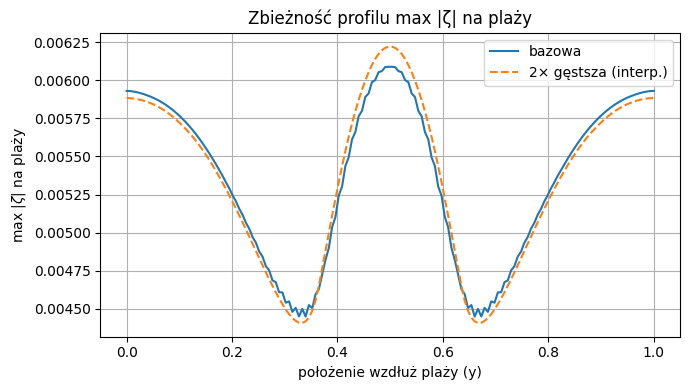

Maksymalna względna różnica profilu na plaży: 2.44%


In [19]:
y_far, zeta_max_beach_far = max_amplitude_fields(sim_base_far, zeta_base_far, "siatka bazowa")

y_fine_far, zeta_max_beach_fine_far = max_amplitude_fields(sim_fine_far, zeta_fine_far, "siatka 2× gęstsza")

zeta_fine_interp_far = np.interp(y_far, y_fine_far, zeta_max_beach_fine_far)

plt.figure(figsize=(7, 4))
plt.plot(y_far, zeta_max_beach_far, label="bazowa")
plt.plot(y_far, zeta_fine_interp_far, "--", label="2× gęstsza (interp.)")
plt.xlabel("położenie wzdłuż plaży (y)")
plt.ylabel(r"max $|\zeta|$ na plaży")
plt.grid(True)
plt.legend()
plt.title("Zbieżność profilu max |ζ| na plaży")
plt.tight_layout()
plt.show()

rel_err = np.max(
    np.abs(zeta_fine_interp_far - zeta_max_beach_far) /
    np.maximum(1e-6, np.abs(zeta_fine_interp_far))
)
print(f"Maksymalna względna różnica profilu na plaży: {rel_err:.2%}")


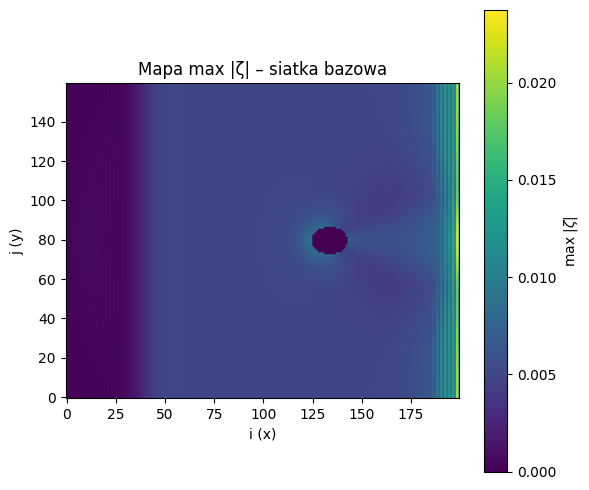

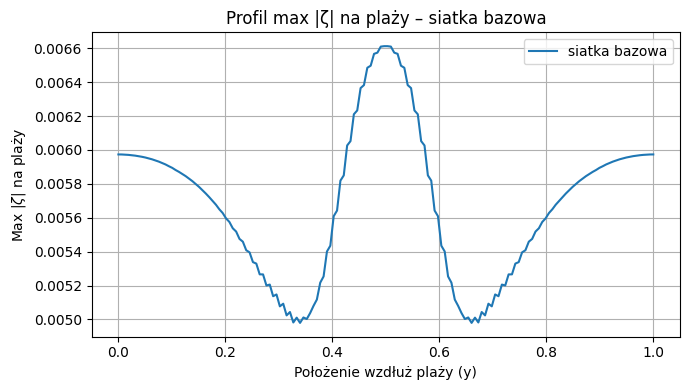

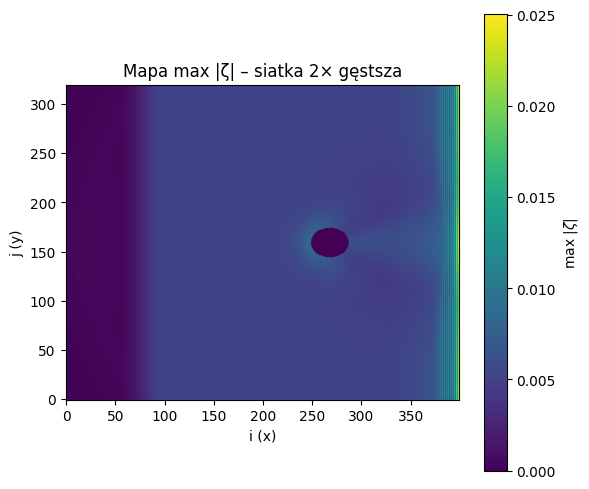

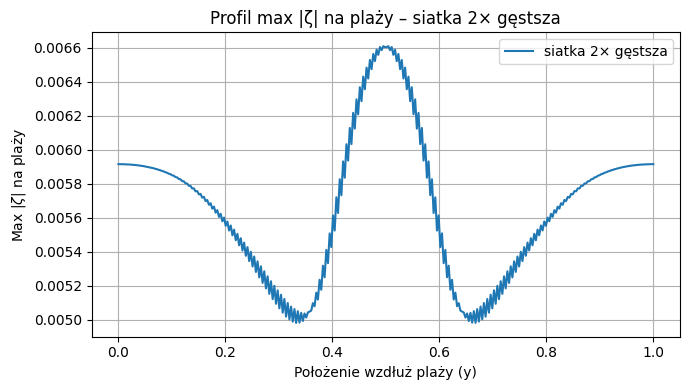

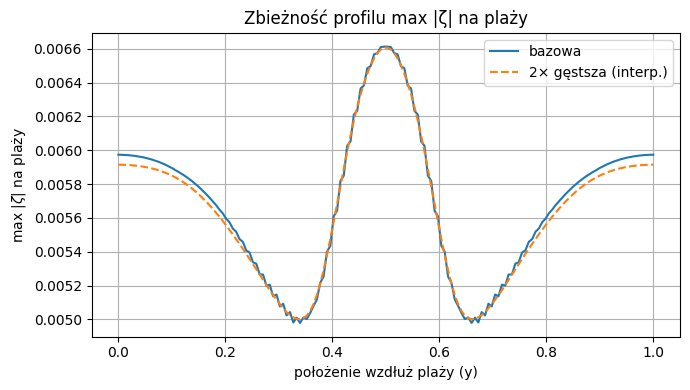

Maksymalna względna różnica profilu na plaży: 0.99%


In [20]:
y_deep, zeta_max_beach_deep = max_amplitude_fields(sim_base_deep, zeta_base_deep, "siatka bazowa")

y_fine_deep, zeta_max_beach_fine_deep = max_amplitude_fields(sim_fine_deep, zeta_fine_deep, "siatka 2× gęstsza")

zeta_fine_interp_deep = np.interp(y_deep, y_fine_deep, zeta_max_beach_fine_deep)

plt.figure(figsize=(7, 4))
plt.plot(y_deep, zeta_max_beach_deep, label="bazowa")
plt.plot(y_deep, zeta_fine_interp_deep, "--", label="2× gęstsza (interp.)")
plt.xlabel("położenie wzdłuż plaży (y)")
plt.ylabel(r"max $|\zeta|$ na plaży")
plt.grid(True)
plt.legend()
plt.title("Zbieżność profilu max |ζ| na plaży")
plt.tight_layout()
plt.show()

rel_err = np.max(
    np.abs(zeta_fine_interp_deep - zeta_max_beach_deep) /
    np.maximum(1e-6, np.abs(zeta_fine_interp_deep))
)
print(f"Maksymalna względna różnica profilu na plaży: {rel_err:.2%}")

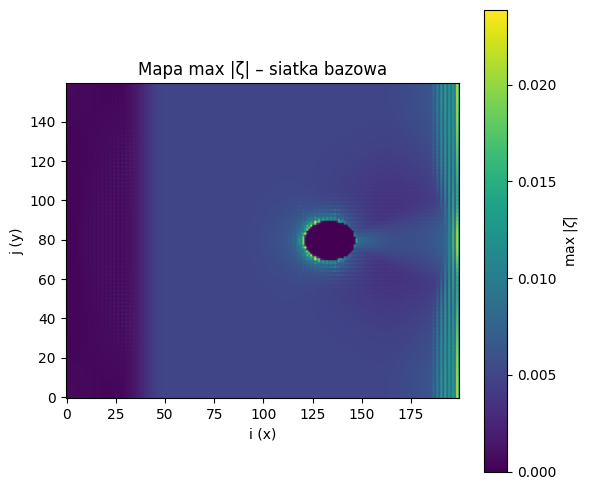

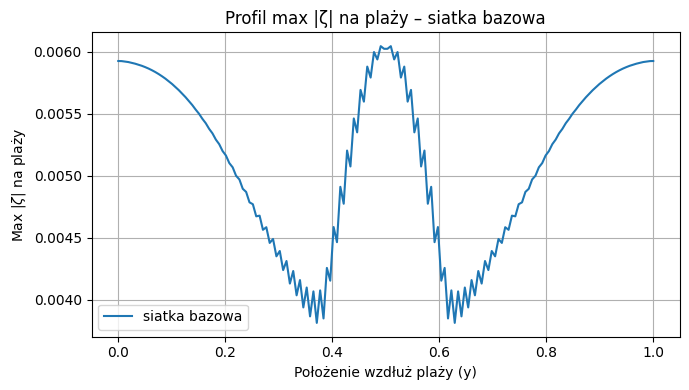

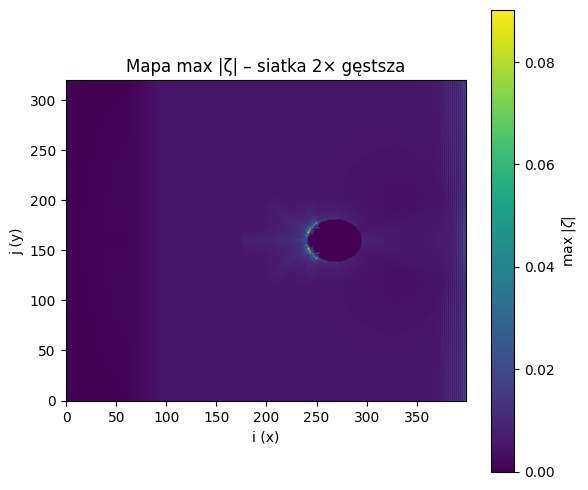

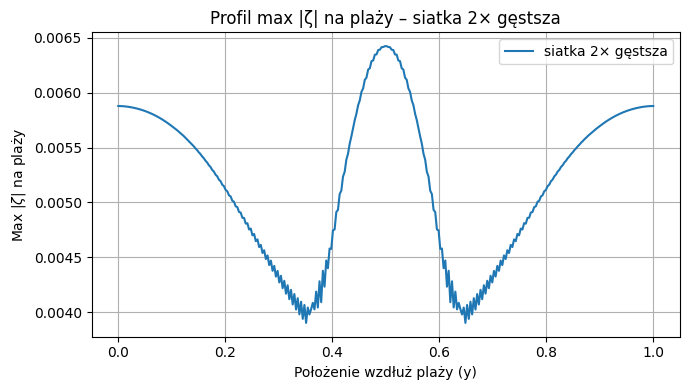

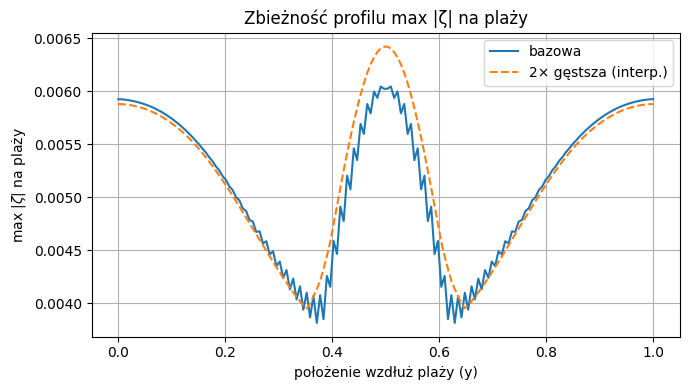

Maksymalna względna różnica profilu na plaży: 10.92%


In [21]:
y_wide, zeta_max_beach_wide = max_amplitude_fields(sim_base_wide, zeta_base_wide, "siatka bazowa")

y_fine_wide, zeta_max_beach_fine_wide = max_amplitude_fields(sim_fine_wide, zeta_fine_wide, "siatka 2× gęstsza")

zeta_fine_interp_wide = np.interp(y_wide, y_fine_wide, zeta_max_beach_fine_wide)

plt.figure(figsize=(7, 4))
plt.plot(y_wide, zeta_max_beach_wide, label="bazowa")
plt.plot(y_wide, zeta_fine_interp_wide, "--", label="2× gęstsza (interp.)")
plt.xlabel("położenie wzdłuż plaży (y)")
plt.ylabel(r"max $|\zeta|$ na plaży")
plt.grid(True)
plt.legend()
plt.title("Zbieżność profilu max |ζ| na plaży")
plt.tight_layout()
plt.show()

rel_err = np.max(
    np.abs(zeta_fine_interp_wide - zeta_max_beach_wide) /
    np.maximum(1e-6, np.abs(zeta_fine_interp_wide))
)
print(f"Maksymalna względna różnica profilu na plaży: {rel_err:.2%}")

In [38]:
def max_eta_beach_profile(sim, zeta_frames, x_beach_frac=0.9):
    nx, ny = sim["grid"]
    zeta_max = np.max(np.abs(zeta_frames), axis=0)  # (nx, ny)

    i_beach = int(x_beach_frac * nx)
    y_coords = np.linspace(0.0, 1.0, ny)
    zeta_max_beach = zeta_max[i_beach, :]

    return y_coords, zeta_max_beach


def plot_all_beach_profiles(x_beach_frac=0.9):
    configs = [
        ("bazowa",
         sim_base_ref,  zeta_base_ref,
         sim_fine_ref,  zeta_fine_ref),

        ("wyspa dalej od brzegu",
         sim_base_far,  zeta_base_far,
         sim_fine_far,  zeta_fine_far),

        ("głębsza mielizna",
         sim_base_deep, zeta_base_deep,
         sim_fine_deep, zeta_fine_deep),

        ("szersza wyspa",
         sim_base_wide, zeta_base_wide,
         sim_fine_wide, zeta_fine_wide),
    ]

    fig, axes = plt.subplots(2, 2, figsize=(10, 8),
                             sharex=True, sharey=True,
                             constrained_layout=True)

    handles = None

    for ax, (title, sim_b, zeta_b, sim_f, zeta_f) in zip(axes.ravel(), configs):
        y_b, prof_b = max_eta_beach_profile(sim_b, zeta_b, x_beach_frac)
        y_f, prof_f = max_eta_beach_profile(sim_f, zeta_f, x_beach_frac)

        # interpolacja profilu z siatki gęstszej na y siatki bazowej
        prof_f_interp = np.interp(y_b, y_f, prof_f)

        line_b, = ax.plot(y_b, prof_b, label="bazowa")
        line_f, = ax.plot(y_b, prof_f_interp, "--", label="2× gęstsza")

        ax.set_title(title)
        ax.grid(True)

        handles = (line_b, line_f)  # zapamiętujemy do wspólnej legendy

    # opisy osi tylko na dole/lewej, żeby nie marnować miejsca
    axes[1, 0].set_xlabel("położenie wzdłuż plaży (y)")
    axes[1, 1].set_xlabel("położenie wzdłuż plaży (y)")
    axes[0, 0].set_ylabel(r"max $|\zeta|$ na plaży")
    axes[1, 0].set_ylabel(r"max $|\zeta|$ na plaży")

    # jedna wspólna legenda dla całej figury
    fig.legend(
        handles,
        ["bazowa", "2× gęstsza"],
        loc="center left",
        bbox_to_anchor=(1.02, 0.5),  # (x, y) względem figury – 1.02 trochę na prawo
        borderaxespad=0.,
    )

    fig.suptitle("Profil max |ζ| na plaży dla różnych batymetrii\n"
                 "(siatka bazowa vs 2× gęstsza)")
    plt.show()



In [27]:
def snapshots_both_grids(sim_base, zeta_base, sim_fine, zeta_fine, frames=(0, None, -1)):
    def make_frame_list(zeta_frames, frames):
        n_frames = zeta_frames.shape[0]
        fr_list = []
        for f in frames:
            if f is None:
                fr_list.append(n_frames // 2)
            elif f < 0:
                fr_list.append(n_frames + f)
            else:
                fr_list.append(f)
        return fr_list

    fr_base = make_frame_list(zeta_base, frames)
    fr_fine = make_frame_list(zeta_fine, frames)

    A = max(np.max(np.abs(zeta_base)), np.max(np.abs(zeta_fine)))

    fig, axes = plt.subplots(
        2, len(fr_base),
        figsize=(4 * len(fr_base), 6),
        sharex=True,
        sharey=True,
        constrained_layout=True,
    )

    outfreq_base = sim_base["outfreq"]
    outfreq_fine = sim_fine["outfreq"]

    for col, fr in enumerate(fr_base):
        ax = axes[0, col]
        im = ax.imshow(
            zeta_base[fr].T,
            origin="lower",
            cmap="RdBu_r",
            vmin=-A,
            vmax=A,
            extent=(0.0, 1.0, 0.0, 1.0),
            aspect="equal",
        )
        ax.set_title(f"bazowa, t ≈ {fr * outfreq_base}")
        if col == 0:
            ax.set_ylabel("j (y)")

    for col, fr in enumerate(fr_fine):
        ax = axes[1, col]
        im = ax.imshow(
            zeta_fine[fr].T,
            origin="lower",
            cmap="RdBu_r",
            vmin=-A,
            vmax=A,
            extent=(0.0, 1.0, 0.0, 1.0),
            aspect="equal",
        )
        ax.set_title(f"2× gęstsza, t ≈ {fr * outfreq_fine}")
        if col == 0:
            ax.set_ylabel("j (y)")
        ax.set_xlabel("i (x)")

    fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.85, label=r"$\zeta$")

    fig.suptitle("Snapshoty ζ – porównanie siatki bazowej i 2× gęstszej")
    plt.show()


In [58]:
def plot_gauges_two_grids(times_base, zeta_ts_base,
                          times_fine, zeta_ts_fine):
    gauge_order = ["plaża - środek", "plaża - dół", "za wyspą", "plaża - góra"]

    color_map = {
        "plaża - środek": "C0",  # niebieski
        "plaża - góra":   "C1",  # pomarańczowy
        "plaża - dół":    "C2",  # zielony
        "za wyspą":       "C3",  # czerwony
    }

    fig, axes = plt.subplots(
        1, 2, figsize=(10, 4),
        sharey=True, constrained_layout=True
    )

    ax_left, ax_right = axes

    handles = []
    labels = []

    for g in gauge_order:
        ls = "--" if g == "plaża - góra" else "-"
        lw = 2.2 if g == "plaża - góra" else 1.4
        zord = 5 if g == "plaża - góra" else 3

        line, = ax_left.plot(
            times_base, zeta_ts_base[g],
            color=color_map[g],
            linestyle=ls,
            linewidth=lw,
            zorder=zord,
            label=g,
        )
        handles.append(line)
        labels.append(g)

    ax_left.set_title("Boje – siatka bazowa")
    ax_left.set_xlabel("krok czasowy")
    ax_left.set_ylabel(r"$\zeta$")
    ax_left.grid(True)

    for g in gauge_order:
        ls = "--" if g == "plaża - góra" else "-"
        lw = 2.2 if g == "plaża - góra" else 1.4
        zord = 5 if g == "plaża - góra" else 3

        ax_right.plot(
            times_fine, zeta_ts_fine[g],
            color=color_map[g],
            linestyle=ls,
            linewidth=lw,
            zorder=zord,
        )

    ax_right.set_title("Boje – siatka 2× gęstsza")
    ax_right.set_xlabel("krok czasowy")
    ax_right.grid(True)

    fig.legend(
        handles, labels,
        loc="center left",
        bbox_to_anchor=(1.02, 0.5),
        borderaxespad=0.0,
    )

    fig.suptitle("Boje na plaży / za wyspą – porównanie siatek", y=1.06)

    plt.show()

## Cel projektu i pytanie badawcze

Celem projektu jest zbadanie, jak złożone dno (wyspa, otaczająca ją mielizna i plaża) wpływa na propagację fali na płytkiej wodzie.  
Interesuje nas w szczególności:

- czy za wyspą pojawia się ogniskowanie fali (zwiększenie amplitudy),
- zachowanie fali na plaży,
- czy wynik jest stabilny numerycznie – tzn. czy po przejściu na siatkę 2× gęstszą kształt fali i wnioski fizyczne pozostają takie same.

Do tego celu używamy modelu 2D równań płytkiej wody oraz kilku wariantów dna (konfiguracja referencyjna + trzy modyfikacje wyspy/mielizny).

## Model fizyczny i użyte wzory

Zakładamy, że mamy nieściśliwą ciecz o głębokości całkowitej \(h(x,y,t)\) opisanej jako
sumę dna i zaburzenia poziomu wody:
$$
h(x,y,t) = H(x,y) + \zeta(x,y,t),
$$
gdzie:
- \(H(x,y)\) – stała w czasie batymetria (głębokość spoczynkowa),
$
\zeta(x,y,t)
$ – chwilowe zaburzenie poziomu wody.

W modelu równań płytkiej wody rozwiązujemy układ:
$$
\partial_t h + \partial_x (hu) + \partial_y (hv) = 0,
$$

$$
\partial_t (hu) +
\partial_x\!\left(hu^2 + \tfrac{1}{2} g h^2\right) +
\partial_y(huv)
= - g h \,\partial_x H,
$$

$$
\partial_t (hv) +
\partial_x(huv) +
\partial_y\!\left(hv^2 + \tfrac{1}{2} g h^2\right)
= - g h \,\partial_y H,
$$
gdzie:
- \(u, v\) – składowe prędkości w kierunkach \(x\) i \(y\),
- \(g\) – przyspieszenie grawitacyjne.

Dla małych zaburzeń na tle stałej głębokości \(H\) prędkość fazowa fali na wodzie płytkiej wynosi:
$$
c = \sqrt{g H}.
$$

Oznacza to, że fala porusza się szybciej na głębokiej wodzie, a wolniej na mieliznach –
co jest kluczowe w naszym projekcie, bo właśnie różnice w \(H(x,y)\) (wyspa, mielizny, plaża)
powodują ugięcie i ogniskowanie fali.

W kodzie rozwiązujemy problem numerycznie na jednorodnej siatce o krokach
dx = dy i kroku czasowym dt.
Pojawia się tam parametr typu `dt_over_dxy`, który w praktyce jest równy
dt / dx = dt / dy:
$$
\texttt{dt\_over\_dxy} \;\approx\; \frac{\Delta t}{\Delta x}
\;=\; \frac{\Delta t}{\Delta y}.
$$


## Dno referencyjne i trzy warianty

Na rysunku z czterema mapami dna widać:

- **bazową batymetrię** – wyspa w środku zbiornika, otoczona pierścieniem mielizny; po prawej stronie znajduje się strefa płytkiej plaży,
- **„wyspę dalej od brzegu”** – wyspa przesunięta bardziej w lewo; fala ma dłuższy odcinek głębokiej wody zanim dotrze do przeszkody,
- **„głębszą mieliznę”** – ta sama geometria, ale mielizna wokół wyspy jest głębsza, więc efekt spowolnienia fali na mieliźnie jest słabszy,
- **„szerszą wyspę”** – większy promień wyspy i szerszy pierścień mielizny, co daje dłuższy odcinek bardzo płytkiej wody wokół przeszkody.

Kolor reprezentuje głębokość \(H(x,y)\): wartości małe (ciemny kolor) odpowiadają wyspie/mieliznom, większe – głębokiej części jeziora.  
To właśnie zmiany \(H\) sterują lokalną prędkością fali $(c = \sqrt{gH})$ i decydują, gdzie fala będzie się ogniskować lub „ucinać”.


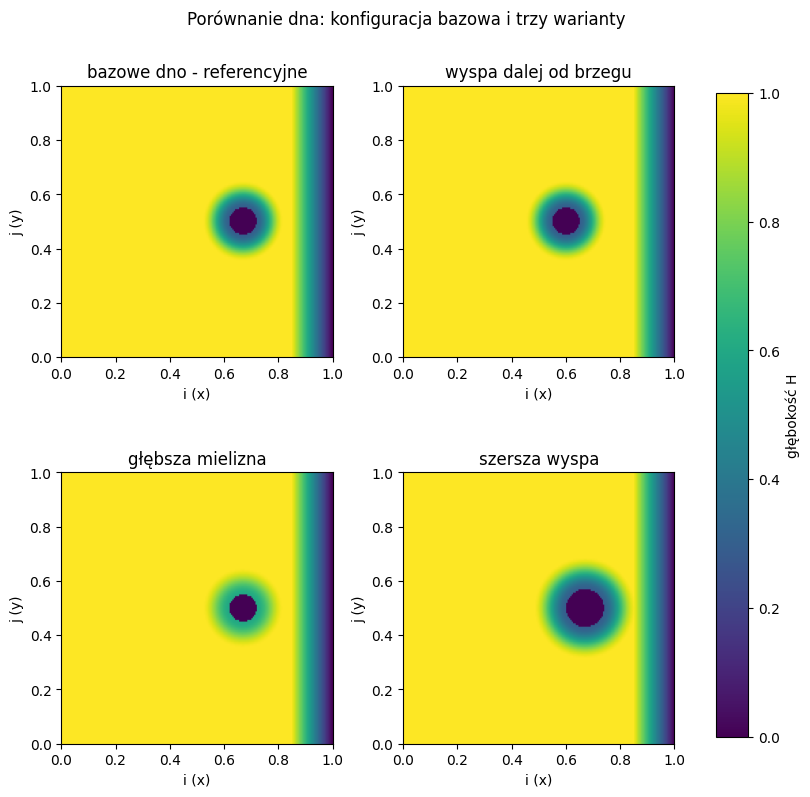

In [55]:
grid = base_params["grid"]
H_ref  = build_bathymetry_island_param(grid, cfg_ref)
H_far  = build_bathymetry_island_param(grid, cfg_distance_far)
H_deep = build_bathymetry_island_param(grid, cfg_shoal_deep)
H_wide = build_bathymetry_island_param(grid, cfg_island_wide)
H_min = 0.0
H_max = max(np.max(H_ref), np.max(H_far), np.max(H_deep), np.max(H_wide))
fig, axes = plt.subplots(
    2, 2,
    figsize=(8, 8),
    constrained_layout=True
)
configs = [
    (axes[0, 0], H_ref,  "bazowe dno - referencyjne"),
    (axes[0, 1], H_far,  "wyspa dalej od brzegu"),
    (axes[1, 0], H_deep, "głębsza mielizna"),
    (axes[1, 1], H_wide, "szersza wyspa"),
]
for ax, H, title in configs:
    im = ax.imshow(
        H.T,
        origin="lower",
        cmap="viridis",
        vmin=H_min,
        vmax=H_max,
        extent=(0.0, 1.0, 0.0, 1.0),
        aspect="equal",
    )
    ax.set_title(title)
    ax.set_xlabel("i (x)")
    ax.set_ylabel("j (y)")
fig.colorbar(im, ax=axes.ravel().tolist(), label="głębokość H", shrink=0.85)
fig.suptitle("Porównanie dna: konfiguracja bazowa i trzy warianty")
plt.show()

## Warunek początkowy – fala Gaussa

Na osobnym rysunku pokazano **warunek początkowy** – pionowy „garb” Gaussa wzdłuż osi \(x\), stały w \(y\).  
Jest to zaburzenie $\zeta_0(x)$ o niewielkiej amplitudzie, dodane do spoczynkowej głębokości \(H(x,y)\):
$$
\zeta_0(x) = A \exp\!\left[-\frac{(x-x_0)^2}{2\sigma^2}\right],
\qquad
h(x,y,0) = H(x,y) + \zeta_0(x).
$$
Początkowo prędkości są równe zeru, ale numerycznie taki garb bardzo szybko zamienia się w pakiet falowy poruszający się w kierunku \(x\).
Dzięki temu możemy obserwować, jak paczka fali wchodzi na wyspę i plażę.


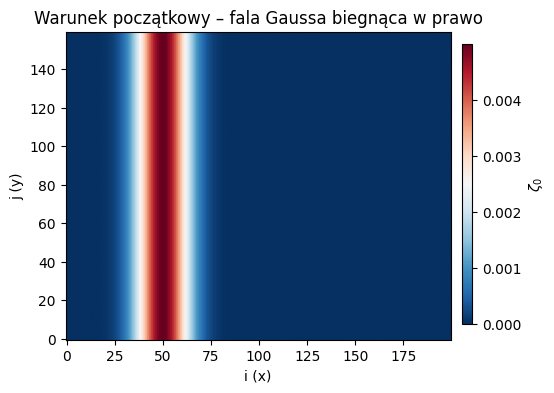

In [50]:
h0_base, uh0_base, vh0_base = build_initial_travelling_wave(
    H_example, grid_example, g=10.0
)

zeta0_base = h0_base - H_example

fig, ax = plt.subplots(figsize=(5, 4))

im = ax.imshow(zeta0_base.T, origin="lower", cmap="RdBu_r")
ax.set_title("Warunek początkowy – fala Gaussa biegnąca w prawo")
ax.set_xlabel("i (x)")
ax.set_ylabel("j (y)")

# [x0, y0, szerokość, wysokość] w jednostkach figury
cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im, cax=cax, label=r"$\zeta_0$")

plt.show()

## Snapshoty fali – porównanie siatki bazowej i 2× gęstszej

Na rysunku z sześcioma panelami (góra: siatka bazowa, dół: siatka 2× gęstsza) pokazano kolejne snapshoty zaburzenia $\zeta(x,y,t)$:

- dla małych czasów widzimy, jak paczka Gaussa zbliża się z lewej strony do wyspy,
- po interakcji z wyspą na mieliznach tworzą się silniejsze zaburzenia – część fali ulega odbiciu, część omija wyspę,
- za wyspą widać obszar podwyższonej amplitudy – efekt ogniskowania fali na płytkiej wodzie,
- przy prawej krawędzi domeny, w obszarze plaży, zaburzenie również nie jest równomierne. 
Profil maksymalnej wartości $|\zeta|$ pokazuje, że **największa amplituda pojawia się właśnie
w osi za wyspą**, natomiast po bokach widać wyraźne obniżenie.

Porównanie górnego (bazowa) i dolnego (2× gęstsza) rzędu pokazuje, że struktura fali jest praktycznie taka sama – różnice są jedynie detaliczne.  
To sugeruje, że rozwiązanie jest już numerycznie ustalone: zagęszczenie siatki nie zmienia jakościowo odpowiedzi układu.


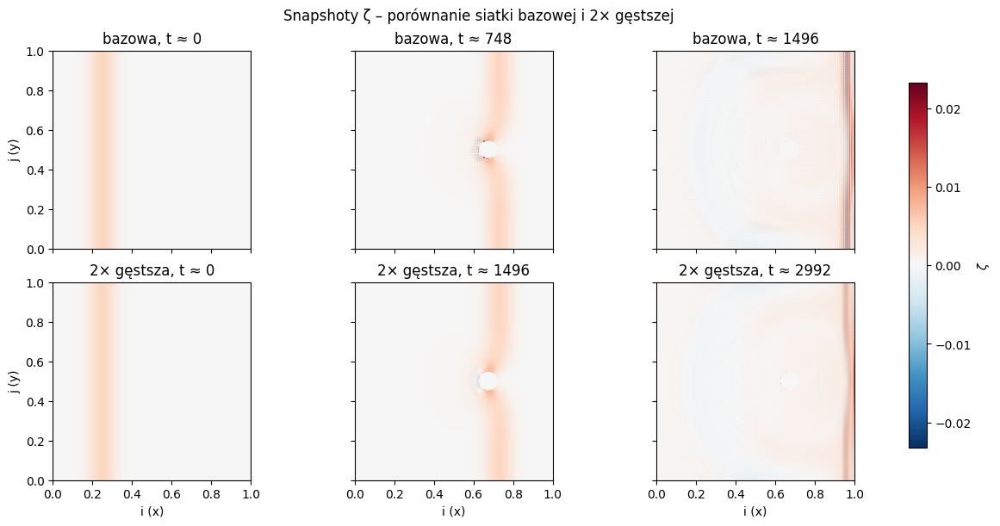

In [52]:
snapshots_both_grids(sim_base_ref, zeta_base_ref, sim_fine_ref, zeta_fine_ref,frames=(0, None, -1))

## Porównanie wartości $|\zeta|$ fali na przestrzeni plaży
Na poniższym rysunku zauważyć można zachowanie się amplitudy fali docierającej do plażdy - w zależności od wartości y/Deltay, reprezentującą przestrzenne położenie na plaży, zauważyć można gdzie następuje wzmocnienie i osłabienie fali. 
Dla wszystkich czterech wariantów dna wyniki zarówno dla siatki bazowej, jak i 2x gęstszej pokrywają się - następuje wzmocnienie amplitudy fali pochodzącej od ogniskowania wyspy, oraz wysokie wartości przy granicach plaży - tam fala nie została w żadnym stopniu zaburzona przez wyspę i jej późniejsze efekty.

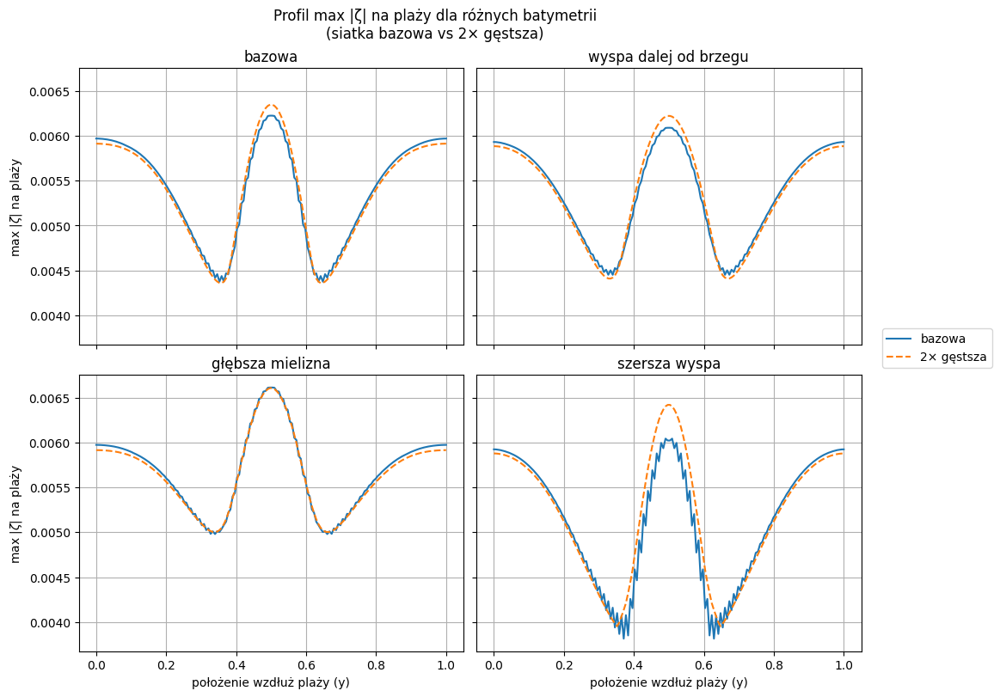

In [56]:
plot_all_beach_profiles(x_beach_frac=0.9)

## Boje na plaży i za wyspą – porównanie siatek

Na ostatnim rysunku widać dwa wykresy:

- **po lewej**: czasówki $\zeta(t)$ na czterech bojach dla siatki bazowej,
- **po prawej**: te same boje dla siatki 2× gęstszej.

Boje są rozmieszczone tak, aby „łapać” kluczowe efekty:
- trzy boje na plaży: w środku, u góry i u dołu brzegu,
- jedna boja „za wyspą” w osi symetrii.

Wyniki pokazują:

- na boi „za wyspą” fala pojawia się wcześniej i ma dużą amplitudę – to miejsce, gdzie dochodzi do ogniskowania po przejściu przez obszar mielizn wokół wyspy;
- na plaży amplituda jest największa dla boi środkowej, jest ona przesunięta w czasie względem docierającej do góry oraz dołu plaży fali, oraz osiąga w swoim maksimum, zgadza się to z wykresami przedstawionymi powyżej, gdzie maksymalna amplituda zobserwowana była w geometrycznym środku plaży;
- kształt krzywych w siatce bazowej i 2× gęstszej jest praktycznie ten sam: maksima, czasy nadejścia i relacje między bojami pokrywają się bardzo dobrze.

To porównanie jest ważne, bo pokazuje zbieżność rozwiązania: zagęszczenie siatki nie zmienia fizycznego obrazu propagacji fali, a jedynie poprawia rozdzielczość szczegółów.



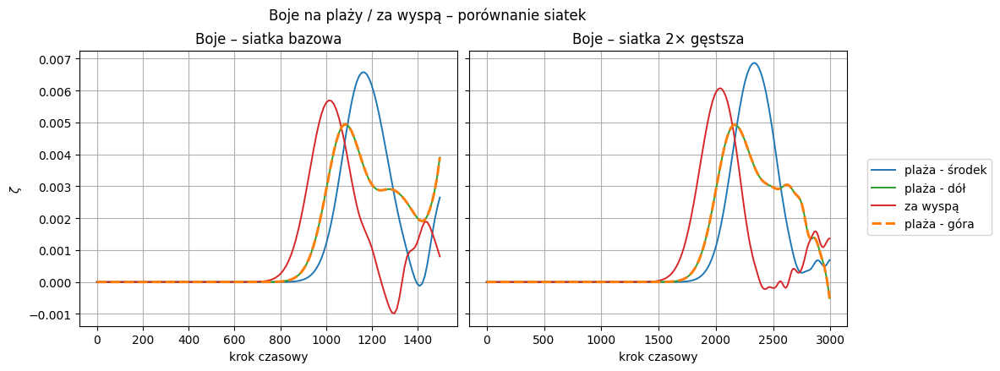

In [59]:
plot_gauges_two_grids(times_base, zeta_ts_base,
                      times_fine, zeta_ts_fine)

## Podsumowanie

W projekcie udało się zasymulować model propagowania falii gausowskiej wykorzystując równanie płytkiej wody. Uwzględniając dodaną do geometrii wyspę wraz z mielizną dla czterech wariantów dna. W celu analizy zbieżności zwiększono dwukrotnie siatkę oraz liczbę kroków czasowych, zostawiając stałą wartość dt_over_dxy. Wyniki mają sens fizyczny, fala przechodząc przez obszar mielizny zmniejsza swoją prędkość, a więc zwiększa amplitudę, co skutkuje zwiększeniem końcowej wartości $\zeta$ fali dochodzącej do plaży. 
